In [1]:
import folium
from folium.plugins import MarkerCluster
from folium.plugins import HeatMap
from folium.plugins import HeatMapWithTime
import pandas as pd
import json

In [2]:
df = pd.read_excel('../data/ACLED/ethiopia_2015-2019_Apr27.xlsx')
df.head()

,ISO,EVENT_ID_CNTY,EVENT_ID_NO_CNTY,EVENT_DATE,YEAR,TIME_PRECISION,EVENT_TYPE,SUB_EVENT_TYPE,ACTOR1,ASSOC_ACTOR_1,...,ADMIN3,LOCATION,LATITUDE,LONGITUDE,GEO_PRECISION,SOURCE,SOURCE_SCALE,NOTES,FATALITIES,TIMESTAMP
0,231,ETH2048,2048,2015-01-25,2015,1,Protests,Excessive force against protesters,Protesters (Ethiopia),UDJ: Unity for Democracy and Justice,...,Addis Ababa,Addis Ababa,9.033,38.700,1,Zehabesha.com,National,At least 26 protesters were injured when Ethio...,0,1552577392
1,231,ETH2050,2050,2015-04-22,2015,1,Riots,Violent demonstration,Rioters (Ethiopia),NaN,...,Addis Ababa,Addis Ababa,9.033,38.700,1,The Reporter,National,Clashes between police and protesters erupted ...,0,1552577384
2,231,ETH2051,2051,2015-06-01,2015,1,Battles,Armed clash,Military Forces of Ethiopia (1995-2018),Police Forces of Ethiopia (1995-2018),...,Bako Gazer,Jinka,5.283,36.767,2,ESAT News,Subnational-national,A conflict between Hamar pastoralists and Ethi...,48,1552577380
3,231,ETH2052,2052,2015-06-15,2015,2,Violence against civilians,Attack,Police Forces of Ethiopia (1995-2018),NaN,...,Ambo Zuria,Ambo,8.983,37.850,2,Amnesty International,Other,A member of the Oromo Federalist Congress (OFC...,1,1552577379
4,231,ETH2053,2053,2015-06-16,2015,1,Violence against civilians,Attack,Police Forces of Ethiopia (1995-2018),TPLF: Tigray Peoples Liberation Front,...,Debre Markos,Debre Markos,10.350,37.733,1,Reuters; Ethiomedia,International,A young leader of the opposition Semayawi [Blu...,1,1552577379


### Examples of marker clusters

In [3]:
m = folium.Map([8.9, 38.7], zoom_start=4, width=400, height=400)

marker_cluster = MarkerCluster().add_to(m)

for index, row in df.iterrows():
    folium.Marker(
        location=[row['LATITUDE'], row['LONGITUDE']],
        popup=row['NOTES'],
        icon=None,
        ).add_to(marker_cluster)

m

In [4]:
m = folium.Map([8.9, 38.7], zoom_start=4, width=400, height=400)

marker_cluster = MarkerCluster(
    locations=zip(df['LATITUDE'], df['LONGITUDE']),
    name='Ethiopian events from 2015-2019',
    popups=[x for x in df['NOTES']], # for some reason, just putting df['NOTES'] didn't work here
    ).add_to(marker_cluster)

marker_cluster.add_to(m)

m

### Examples of heatmaps

In [5]:
m = folium.Map([8.9, 38.7], zoom_start=4, width=800, height=600)

HeatMap(zip(df['LATITUDE'], df['LONGITUDE'])).add_to(m)
m

In [6]:
m = folium.Map([8.9, 38.7], tiles='stamentoner', zoom_start=4, width=800, height=600)

dates = sorted(set(df['EVENT_DATE']))
events = []

for date in dates:
    events.append([[row['LATITUDE'], row['LONGITUDE']] for _, row in df[df['EVENT_DATE'] == date].iterrows()])

HeatMapWithTime(events, index=[a.strftime('%Y-%m-%d') for a in dates]).add_to(m)
m

### Static Markers

In [7]:
m = folium.Map([8.9, 38.7], tiles='stamentoner', zoom_start=4, width=800, height=600)

kw = {
    'radius': 5,
    'color': 'black',
    'fill': True,
    'weight': 1,
    'fill_color': 'green',
    'fill_opacity': 1
}

for index, row in df.iterrows():
    folium.CircleMarker(
        location=[row['LATITUDE'], row['LONGITUDE']],
        tooltip=row['NOTES'],**kw).add_to(m)
m

### Playing with geojson

In [8]:
geo_json_data = json.load(open('../data/ET_region.geojson', 'r'))

In [9]:
m = folium.Map([8.9, 38.7], tiles='stamentoner', zoom_start=6, width=800, height=600)

folium.GeoJson(geo_json_data).add_to(m)
m

### Trying chloropleths

In [10]:
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cm as cmx
from collections import Counter

In [11]:
geo_json_data = json.load(open('../data/ET_region_new.geojson', 'r'))

In [12]:
scalarMap = cmx.ScalarMappable(norm=colors.Normalize(vmin=0, vmax=2080), cmap=plt.get_cmap('YlGn'))
c = Counter(df['ADMIN1'])

In [13]:
m = folium.Map([8.9, 38.7], tiles='stamentoner', zoom_start=6, width=650, height=650)

folium.GeoJson(geo_json_data, tooltip=folium.features.GeoJsonTooltip(fields=['name'], aliases=['Region:']),
              style_function=lambda feature: {
                'fillColor': colors.to_hex(scalarMap.to_rgba(c[feature['properties']['name']])),
                'fillOpacity': 0.9,
             }).add_to(m)
   
m

### Trying it without folium

In [14]:
from shapely.geometry import shape
from descartes import PolygonPatch
import json

import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cm as cmx

In [15]:
geo_json_data = json.load(open('../data/ET_region_new.geojson', 'r'))
c = Counter(df['ADMIN1'])
def get_color(item):
    return colors.to_hex(scalar_map.to_rgba(c[item['properties']['name']]))

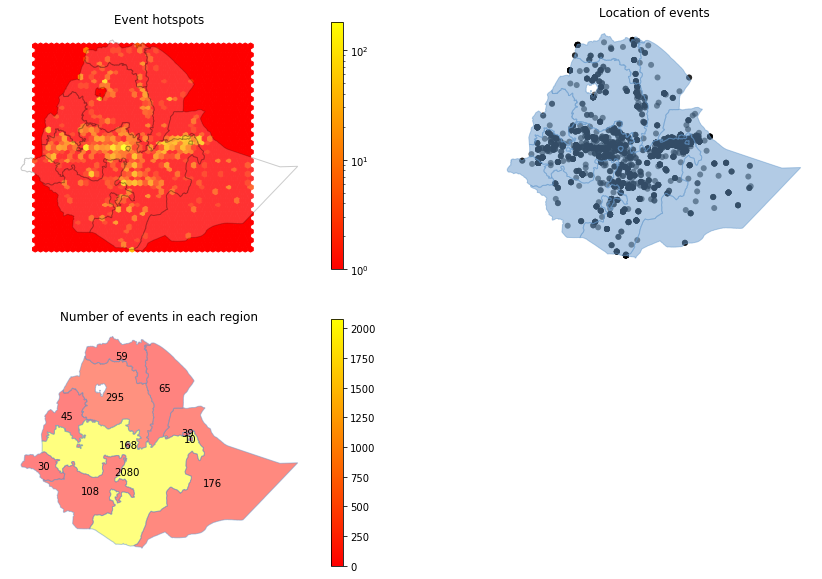

In [18]:
scalar_map = cmx.ScalarMappable(norm=colors.Normalize(vmin=0, vmax=2080), cmap=cmx.autumn)

fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(223)
bx = fig.add_subplot(222)
cx = fig.add_subplot(221)

for feature in geo_json_data['features']:
    poly = shape(feature['geometry'])
    ax.add_patch(PolygonPatch(poly, fc=get_color(feature), ec='#6699cc', alpha=0.5, zorder=2))
    ax.text(poly.centroid.coords[0][0], poly.centroid.coords[0][1], c[feature['properties']['name']], \
            horizontalalignment='center', verticalalignment='center')
    
    bx.add_patch(PolygonPatch(poly, fc='#6699cc', ec='#6699cc', alpha=0.5, zorder=2))
    
    cx.add_patch(PolygonPatch(poly, fc='#ffffff', ec='#000000', alpha=0.2, zorder=1))

fig.colorbar(scalar_map, ax=ax) 
ax.set_title('Number of events in each region')
ax.axis('scaled')
ax.axis('off')

#-----------------------------------------------------------

bx.scatter(df['LONGITUDE'], df['LATITUDE'], c='black', edgecolors='none', alpha=0.6)

bx.set_title('Location of events')
bx.axis('scaled')
bx.axis('off')

#-----------------------------------------------------------

hb = cx.hexbin(df['LONGITUDE'], df['LATITUDE'], gridsize=40, cmap=cmx.autumn, bins='log')

fig.colorbar(hb, ax=cx)
cx.set_title('Event hotspots')
cx.axis('scaled')
cx.axis('off')

#-----------------------------------------------------------

plt.show()